# Spam Detection


**Steps**
1. Load the Data
2. Exploratory Data Analysis
3. Data Preperation
4. Data Transformation
5. Model Building and Evaluation
6. Comparing the scores of models
7. Prediction

## **Step 1 - Load the Data**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Libraries
import pandas as pd
import numpy as np

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt

# Progress tracking
from tqdm import tqdm, tqdm_notebook
tqdm.pandas()

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
# Column names
column_names = ['target', 'text']

# Load dataset
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/590 Project/data/01. SMSSpamCollection.tsv',
                 delimiter='\t',
                 names=column_names,
                 header=None)

# Rearrange columns
df = df[['text', 'target']]

df.head()

,text,target
0,"Go until jurong point, crazy.. Available only ...",ham
1,Ok lar... Joking wif u oni...,ham
2,Free entry in 2 a wkly comp to win FA Cup fina...,spam
3,U dun say so early hor... U c already then say...,ham
4,"Nah I don't think he goes to usf, he lives aro...",ham


## **Step 2 - Exploratory Data Analysis**

In [ ]:
df.shape

(5572, 2)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5572 entries, 0 to 5571
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    5572 non-null   object
 1   target  5572 non-null   object
dtypes: object(2)
memory usage: 87.2+ KB


### **2.a. Explore the Data Distribution of Target Variable**

In [ ]:
# Check the unique values in the target column
print(df['target'].unique())

['ham' 'spam']


In [ ]:
df['target'].value_counts()

,count
target,
ham,4825
spam,747


In [ ]:
df['target'].value_counts(normalize=True)

,proportion
target,
ham,0.865937
spam,0.134063


In [ ]:
# pip install plotly wordcloud

In [ ]:
import plotly.express as px

# Create an interactive count plot using Plotly
fig = px.histogram(df, x='target', color='target', barmode='group')

# Customize the layout
fig.update_layout(
    title="Spam and Ham Count Plot",
    xaxis_title="Target",
    yaxis_title="Count",
    width=500,
    height=300
)

# Update x-axis tick labels
fig.update_xaxes(tickvals=[0, 1], ticktext=["ham", "spam"])

# Show the plot
fig.show()

### **2.b. Visualizing the distribution of most frequent words**

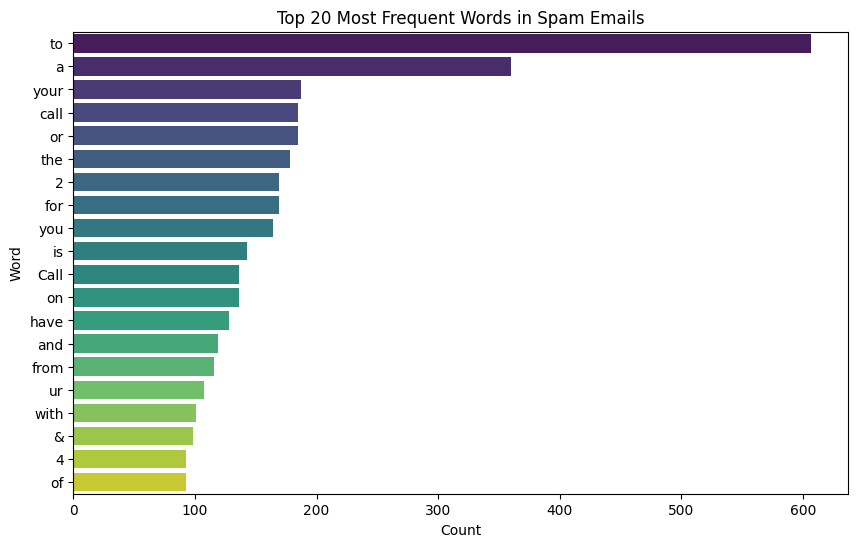

In [ ]:
from collections import Counter

# Filter the DataFrame for ham emails
ham_df = df[df['target'] == 'spam']

# Get all words in the 'text' column of ham emails
all_words = " ".join(ham_df['text'].astype(str).values).split()
word_counts = Counter(all_words)

# Get the most common words
common_words = word_counts.most_common(20)

# Convert to DataFrame for plotting
common_words_df = pd.DataFrame(common_words, columns=['word', 'count'])

# Plot the most common words
plt.figure(figsize=(10, 6))
sns.barplot(data=common_words_df, x='count', y='word', palette='viridis')
plt.title('Top 20 Most Frequent Words in Spam Emails')
plt.xlabel('Count')
plt.ylabel('Word')
plt.show()

### **2.c. Classwise WordCloud - Explore the Relationships between each pair of Inputs and Output**

In [ ]:
# !pip install wordcloud

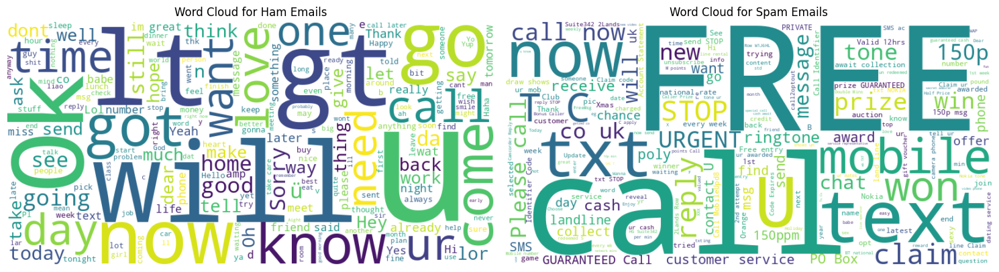

In [ ]:
# Import the necessary libraries
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming you already have the DataFrame 'df' loaded with your data

# Filter the DataFrame for ham and spam emails
ham_df = df[df['target'] == 'ham'].copy()  # Ham emails
spam_df = df[df['target'] == 'spam'].copy()  # Spam emails

# Convert entries in 'text' to string
ham_df['text'] = ham_df['text'].astype(str)
spam_df['text'] = spam_df['text'].astype(str)

# Combine all the text in the 'text' columns
ham_text = " ".join(review for review in ham_df['text'])
spam_text = " ".join(review for review in spam_df['text'])

# Generate word cloud images
ham_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(ham_text)
spam_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(spam_text)

# Set up the subplots
plt.figure(figsize=(15, 7))

# Plot ham word cloud
plt.subplot(1, 2, 1)
plt.imshow(ham_wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Ham Emails')
plt.axis("off")  # Turn off the axis

# Plot spam word cloud
plt.subplot(1, 2, 2)
plt.imshow(spam_wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Spam Emails')
plt.axis("off")  # Turn off the axis

# Adjust space between the plots
plt.subplots_adjust(wspace=0.5)  # Increase wspace for more separation

# Show the combined plot
plt.tight_layout()
plt.show()

## **Step-3 Data Preparation**


### **3.a. Data Cleaning on text column**

In [ ]:
# # Libraries
# import re
# import nltk
# nltk.download('stopwords')
# nltk.download('wordnet')
# from nltk.tokenize import word_tokenize
# from nltk.corpus import stopwords
# from nltk.stem.porter import PorterStemmer
# from nltk.stem import WordNetLemmatizer

# # Initialize stemmer and lemmatizer
# stemmer = PorterStemmer()
# lemmatizer = WordNetLemmatizer()

# # Initialize clean text list
# clean_text = []

# # Preprocess function
# def preprocess(raw_text, flag):
#     # Handle NaN values
#     if pd.isnull(raw_text):
#         return ""

#     # Remove special characters and digits
#     raw_text = re.sub("[^a-zA-Z0-9]", " ", raw_text)

#     # Lowercase text
#     raw_text = raw_text.lower()

#     # Tokenize into words
#     clean_tokens = raw_text.split()

#     # Remove stop words
#     words = [token for token in clean_tokens if token not in stopwords.words("english")]

#     # Stemming or Lemmatization
#     if flag == 'stem':
#         words = [stemmer.stem(word) for word in words]
#     else:
#         words = [lemmatizer.lemmatize(word) for word in words]

#     return " ".join(words)

# # Apply preprocessing
# df['clean_text'] = df['text'].progress_apply(lambda x: preprocess(x, 'lemmatize'))

# # Display cleaned data
# df.head()

# # Save cleaned dataframe to CSV
# df.to_csv('/content/drive/MyDrive/Colab Notebooks/590/data/02. sms.csv', index=False)

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/590 Project/data/02. sms.csv')

df = df[['clean_text', 'target']]

df.head()

,clean_text,target
0,go jurong point crazy available bugis n great ...,ham
1,ok lar joking wif u oni,ham
2,free entry 2 wkly comp win fa cup final tkts 2...,spam
3,u dun say early hor u c already say,ham
4,nah think go usf life around though,ham


In [ ]:
df.shape

(5572, 2)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5572 entries, 0 to 5571
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   clean_text  5565 non-null   object
 1   target      5572 non-null   object
dtypes: object(2)
memory usage: 87.2+ KB


In [ ]:
df.isnull().sum()

,0
clean_text,7
target,0


In [ ]:
# Remove rows with missing values

df = df.dropna()

In [ ]:
df.isnull().sum()

,0
clean_text,0
target,0


In [ ]:
df.shape

(5565, 2)

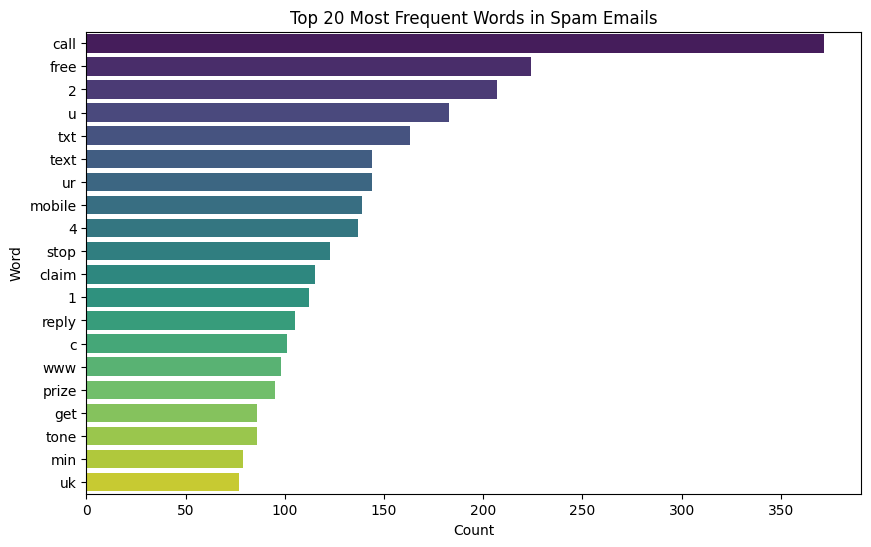

In [ ]:
from collections import Counter

# Filter the DataFrame for ham emails
ham_df = df[df['target'] == 'spam']

# Get all words in the 'clean_text' column of ham emails
all_words = " ".join(ham_df['clean_text'].astype(str).values).split()
word_counts = Counter(all_words)

# Get the most common words
common_words = word_counts.most_common(20)

# Convert to DataFrame for plotting
common_words_df = pd.DataFrame(common_words, columns=['word', 'count'])

# Plot the most common words
plt.figure(figsize=(10, 6))
sns.barplot(data=common_words_df, x='count', y='word', palette='viridis')
plt.title('Top 20 Most Frequent Words in Spam Emails')
plt.xlabel('Count')
plt.ylabel('Word')
plt.show()

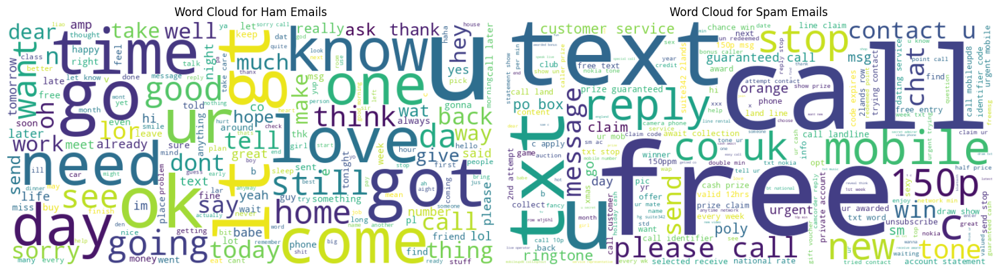

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Filter the DataFrame for ham and spam emails
ham_df = df[df['target'] == 'ham'].copy()  # Ham emails
spam_df = df[df['target'] == 'spam'].copy()  # Spam emails

# Convert entries in 'clean_text' to string using .loc
ham_df.loc[:, 'clean_text'] = ham_df['clean_text'].astype(str)
spam_df.loc[:, 'clean_text'] = spam_df['clean_text'].astype(str)

# Combine all the text in the 'clean_text' columns
ham_text = " ".join(review for review in ham_df['clean_text'])
spam_text = " ".join(review for review in spam_df['clean_text'])

# Generate word cloud images
ham_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(ham_text)
spam_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(spam_text)

# Set up the subplots
plt.figure(figsize=(15, 7))

# Plot ham word cloud
plt.subplot(1, 2, 1)
plt.imshow(ham_wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Ham Emails')
plt.axis("off")  # Turn off the axis

# Plot spam word cloud
plt.subplot(1, 2, 2)
plt.imshow(spam_wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Spam Emails')
plt.axis("off")  # Turn off the axis

# Adjust space between the plots
plt.subplots_adjust(wspace=0.5)

# Show the combined plot
plt.tight_layout()
plt.show()

### **3.b. - Segregate Inputs (X) and Output (y)**

In [ ]:
y = df["target"]
X = df[["clean_text"]]

### **3.c. - Split the data into Train and Test**

In [ ]:
# Splitting into train and test

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(4452, 1) (4452,)
(1113, 1) (1113,)


## **Step 4 - Apply Data Transformation (BERT)**

In [ ]:
from sentence_transformers import SentenceTransformer

# Load the pretrained BERT model
bert_model = SentenceTransformer('all-MiniLM-L6-v2')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning:


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.



modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
# Encode the training and test data
X_train_bert = bert_model.encode(X_train['clean_text'].tolist())
X_test_bert = bert_model.encode(X_test['clean_text'].tolist())

X_combined = np.vstack((X_train_bert, X_test_bert))

# Print the shape of the BERT embeddings
print("X_train BERT shape:", X_train_bert.shape)
print("X_test BERT shape:", X_test_bert.shape)

X_train BERT shape: (4452, 384)
X_test BERT shape: (1113, 384)


In [ ]:
# Ensure y_train and y_test are string types first
y_train = y_train.astype(str)
y_test = y_test.astype(str)

# Replace 'spam' with 0 and 'ham' with 1 for both train and test
y_train = y_train.replace({'spam': 0, 'ham': 1}).astype(int)
y_test = y_test.replace({'spam': 0, 'ham': 1}).astype(int)
y_combined = np.concatenate((y_train, y_test))

In [ ]:
print('X_train_bert, y_train -',X_train_bert.shape,y_train.shape)
print('X_Test_bert ,  y_test -',X_test_bert.shape, y_test.shape)

X_train_bert, y_train - (4452, 384) (4452,)
X_Test_bert ,  y_test - (1113, 384) (1113,)


In [ ]:
# # Ensure target is a string type first
# df['target'] = df['target'].astype(str)

# # Replace 'spam' with 0 and 'ham' with 1
# df['target'] = df['target'].replace({'spam': 0, 'ham': 1}).astype(int)

# # Check the updated DataFrame
# df.head()

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)  # Reduce to 3 dimensions
X_pca_3d = pca.fit_transform(X_combined)  # Apply PCA to combined embeddings

In [ ]:
import plotly.graph_objects as go
from sklearn.preprocessing import LabelEncoder

# PCA Reduction
pca = PCA(n_components=3)  # Reduce to 3 dimensions
X_pca_3d = pca.fit_transform(X_combined)  # Apply PCA to combined embeddings

# Create interactive 3D plot
fig = go.Figure(data=[go.Scatter3d(
    x=X_pca_3d[:, 0],
    y=X_pca_3d[:, 1],
    z=X_pca_3d[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=y_combined,  # Use encoded target labels for color
        colorscale='Viridis',
        opacity=0.8,
        colorbar=dict(title="Target")
    ),
    text=y_combined  # Show original labels as tooltip text
)])

# Set plot layout
fig.update_layout(
    title='PCA of BERT Embeddings (Interactive)',
    scene=dict(
        xaxis_title='PCA Component 1',
        yaxis_title='PCA Component 2',
        zaxis_title='PCA Component 3'
    )
)

# Show the plot
fig.show()

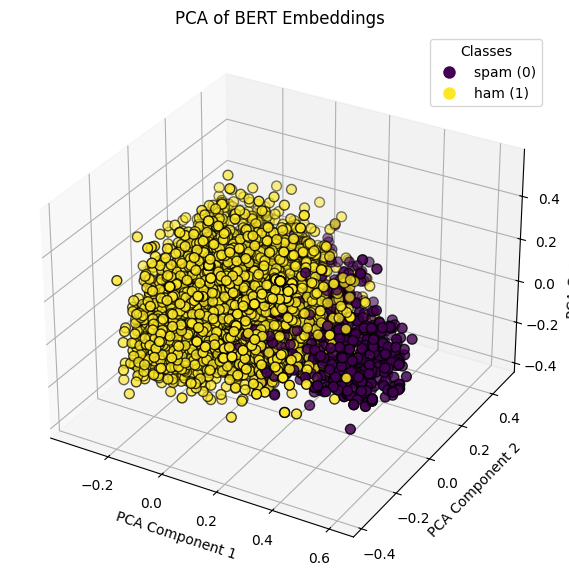

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Ensure y_combined is numeric (0 for spam and 1 for ham)
y_combined = np.array(y_combined, dtype=int)

# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(
    X_pca_3d[:, 0], X_pca_3d[:, 1], X_pca_3d[:, 2],
    c=y_combined, s=50, cmap='viridis', edgecolor='k'
)

# Set axis labels and title
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
plt.title('PCA of BERT Embeddings')

# Adjust the legend to correctly reflect the labels
legend_labels = ['spam (0)', 'ham (1)']  # Correct mapping
handles = [
    plt.Line2D([0], [0], marker='o', color='w',
               markerfacecolor=scatter.cmap(scatter.norm(i)), markersize=10)
    for i in range(len(legend_labels))
]
ax.legend(handles, legend_labels, title="Classes")

# Show the plot
plt.show()

## **Step 5 - Building Model and Evaluation**

### 01. KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

# Define hyperparameters
tuned_parameters = [{'n_neighbors': [i for i in range(1, 12, 2)],
                     'p': [1, 2, 3]}]

# Model definition with GridSearchCV
clf_knn = GridSearchCV(
    estimator=KNeighborsClassifier(),
    param_grid=tuned_parameters,
    scoring='f1',
    cv=5,
    return_train_score=True,
    verbose=1
)

# Fit the model to the training data
clf_knn.fit(X_train_bert, y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits


GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid=[{'n_neighbors': [1, 3, 5, 7, 9, 11], 'p': [1, 2, 3]}],
             return_train_score=True, scoring='f1', verbose=1)

In [ ]:
# Print the best parameters and estimator
print("Best parameters set found on train set:")
print(clf_knn.best_params_)
print(clf_knn.best_estimator_)

# Score on test data
print('Score on Test Data: ', clf_knn.score(X_test_bert, y_test))

Best parameters set found on train set:
{'n_neighbors': 7, 'p': 1}
KNeighborsClassifier(n_neighbors=7, p=1)
Score on Test Data:  0.9829787234042553


In [ ]:
from sklearn.metrics import confusion_matrix

# Make predictions on the test set
y_pred_knn = clf_knn.predict(X_test_bert)

# Create confusion matrix
confusion_knn = confusion_matrix(y_test, y_pred_knn)
print("Confusion Matrix:")
print(confusion_knn)

Confusion Matrix:
[[157   5]
 [ 27 924]]


In [ ]:
from sklearn.metrics import classification_report

# Generate the classification report
report_knn = classification_report(y_test, y_pred_knn)
print("Classification Report:")
print(report_knn)

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.97      0.91       162
           1       0.99      0.97      0.98       951

    accuracy                           0.97      1113
   macro avg       0.92      0.97      0.95      1113
weighted avg       0.97      0.97      0.97      1113



In [ ]:
import plotly.express as px
import plotly.graph_objects as go

# Create a confusion matrix heatmap
fig = px.imshow(confusion_knn,
                 labels=dict(x="Predicted", y="Actual"),
                 x=["Spam (0)", "Ham (1)"],
                 y=["Spam (0)", "Ham (1)"],
                 title="Confusion Matrix for KNN",
                 text_auto=True,
                 color_continuous_scale='Blues')
fig.update_layout(xaxis_title='Predicted Label', yaxis_title='Actual Label')
fig.show()

# Collecting train and test scores for line plot
train_scores_knn = clf_knn.cv_results_['mean_train_score']
test_scores_knn = clf_knn.cv_results_['mean_test_score']

# Create line plot for train and test scores
fig2 = go.Figure()
fig2.add_trace(go.Scatter(x=tuned_parameters[0]['n_neighbors'], y=train_scores_knn, mode='lines+markers', name='Train Score'))
fig2.add_trace(go.Scatter(x=tuned_parameters[0]['n_neighbors'], y=test_scores_knn, mode='lines+markers', name='Test Score'))
fig2.update_layout(title='KNN Train and Test Scores',
                   xaxis_title='Number of Neighbors (K)',
                   yaxis_title='Score',
                   legend=dict(x=0, y=1))
fig2.show()

In [ ]:
import numpy as np
import plotly.graph_objects as go
from sklearn.decomposition import PCA

# Use the best estimator from GridSearchCV without retraining
knn_model = clf_knn.best_estimator_

# Reduce BERT embeddings to 3D for visualization
pca = PCA(n_components=3)
X_train_3D = pca.fit_transform(X_train_bert)

# Create a mesh grid in 3D for decision boundary
x_min, x_max = X_train_3D[:, 0].min() - 1, X_train_3D[:, 0].max() + 1
y_min, y_max = X_train_3D[:, 1].min() - 1, X_train_3D[:, 1].max() + 1
z_min, z_max = X_train_3D[:, 2].min() - 1, X_train_3D[:, 2].max() + 1
xx, yy, zz = np.meshgrid(
    np.linspace(x_min, x_max, 30),
    np.linspace(y_min, y_max, 30),
    np.linspace(z_min, z_max, 30)
)

# Predict on the mesh grid
mesh_points = pca.inverse_transform(np.c_[xx.ravel(), yy.ravel(), zz.ravel()])
predictions = knn_model.predict(mesh_points).reshape(xx.shape)

# Create the 3D plot
fig = go.Figure()

# Plot the decision boundary as a 3D surface
fig.add_trace(go.Surface(
    x=xx[:, :, 0], y=yy[:, :, 0], z=zz[:, :, 0], surfacecolor=predictions[:, :, 0],
    colorscale='Viridis', opacity=0.5, showscale=False
))

# Plot the training data points
fig.add_trace(go.Scatter3d(
    x=X_train_3D[:, 0], y=X_train_3D[:, 1], z=X_train_3D[:, 2],
    mode='markers', marker=dict(size=5, color=y_train, colorscale='Viridis', opacity=0.8),
    name='Training Points'
))

# Customize plot layout
fig.update_layout(
    title='3D Decision Boundary of KNN (PCA-reduced Data)',
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    )
)

fig.show()

### 02. Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Define the tuned parameters for Logistic Regression
tuned_parameters_lr = {
    'penalty': ['l2'],
    'solver': ['liblinear'],
    'max_iter': [100, 200, 300, 500],
    'C': [0.001, 0.01, 0.1, 1, 10, 100]
}

# Model definition with GridSearchCV
clf_lr = GridSearchCV(
    estimator=LogisticRegression(),
    param_grid=tuned_parameters_lr,
    scoring='f1',
    cv=5,
    return_train_score=True,
    verbose=1
)

# Fit the model to the training data
clf_lr.fit(X_train_bert, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'max_iter': [100, 200, 300, 500], 'penalty': ['l2'],
                         'solver': ['liblinear']},
             return_train_score=True, scoring='f1', verbose=1)

In [ ]:
# Print the best parameters and estimator
print("Best parameters set found on train set:")
print(clf_lr.best_params_)
print(clf_lr.best_estimator_)

# Score on test data
print('Score on Test Data: ', clf_lr.score(X_test_bert, y_test))


Best parameters set found on train set:
{'C': 10, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=10, solver='liblinear')
Score on Test Data:  0.9915966386554622


In [ ]:
from sklearn.metrics import confusion_matrix

# Make predictions on the test set
y_pred_lr = clf_lr.predict(X_test_bert)

# Create confusion matrix
confusion_lr = confusion_matrix(y_test, y_pred_lr)
print("Confusion Matrix:")
print(confusion_lr)


Confusion Matrix:
[[153   9]
 [  7 944]]


In [ ]:
from sklearn.metrics import classification_report

# Generate the classification report
report_lr = classification_report(y_test, y_pred_lr)
print("Classification Report:")
print(report_lr)


Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       162
           1       0.99      0.99      0.99       951

    accuracy                           0.99      1113
   macro avg       0.97      0.97      0.97      1113
weighted avg       0.99      0.99      0.99      1113



In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from sklearn.metrics import confusion_matrix, classification_report

# Confusion matrix plot
confusion_lr = confusion_matrix(y_test, y_pred_lr)
fig = px.imshow(confusion_lr,
                text_auto=True,
                color_continuous_scale='Blues',
                labels=dict(x="Predicted", y="Actual", color="Count"),
                x=["Spam (0)", "Ham (1)"],
                y=["Spam (0)", "Ham (1)"])
fig.update_layout(
    title="Confusion Matrix for Logistic Regression",
    width=500,
    height=400
)

# Line plot for training and testing scores
fig_line = go.Figure()
fig_line.add_trace(go.Scatter(x=list(range(1, len(clf_lr.cv_results_['mean_train_score']) + 1)),
                              y=clf_lr.cv_results_['mean_train_score'],
                              mode='lines+markers',
                              name='Train Score'))
fig_line.add_trace(go.Scatter(x=list(range(1, len(clf_lr.cv_results_['mean_test_score']) + 1)),
                              y=clf_lr.cv_results_['mean_test_score'],
                              mode='lines+markers',
                              name='Test Score'))
fig_line.update_layout(
    title="Training and Testing Scores for Logistic Regression",
    xaxis_title="Hyperparameter Combination",
    yaxis_title="Score",
    width=700,
    height=400
)

# Show both plots
fig.show()
fig_line.show()

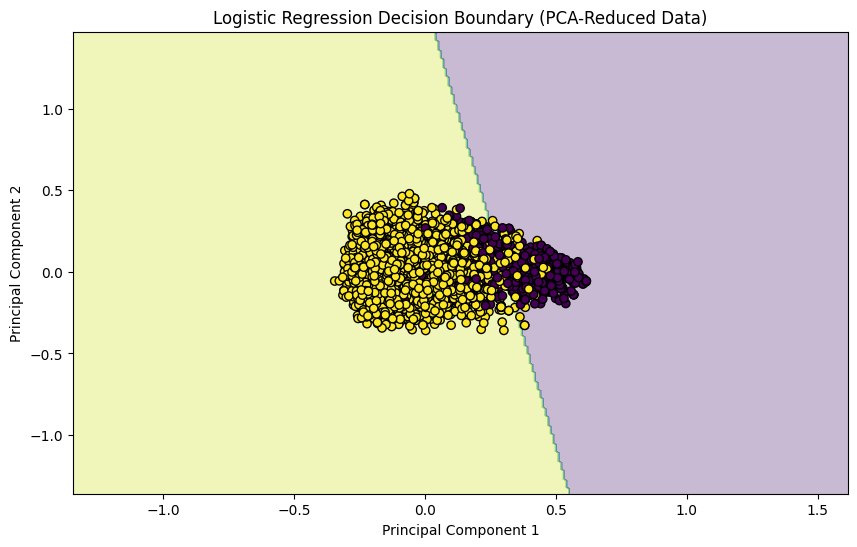

In [ ]:
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

# Reduce BERT embeddings to 2D for visualization
pca = PCA(n_components=2)
X_train_2D = pca.fit_transform(X_train_bert)

# Create a mesh grid for the decision boundary visualization
x_min, x_max = X_train_2D[:, 0].min() - 1, X_train_2D[:, 0].max() + 1
y_min, y_max = X_train_2D[:, 1].min() - 1, X_train_2D[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                     np.arange(y_min, y_max, 0.01))

# Predict on the mesh grid
Z = clf_lr.predict(pca.inverse_transform(np.c_[xx.ravel(), yy.ravel()]))
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.figure(figsize=(10, 6))
plt.contourf(xx, yy, Z, alpha=0.3, cmap='viridis')
plt.scatter(X_train_2D[:, 0], X_train_2D[:, 1], c=y_train, edgecolors='k', cmap='viridis', marker='o')
plt.title('Logistic Regression Decision Boundary (PCA-Reduced Data)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


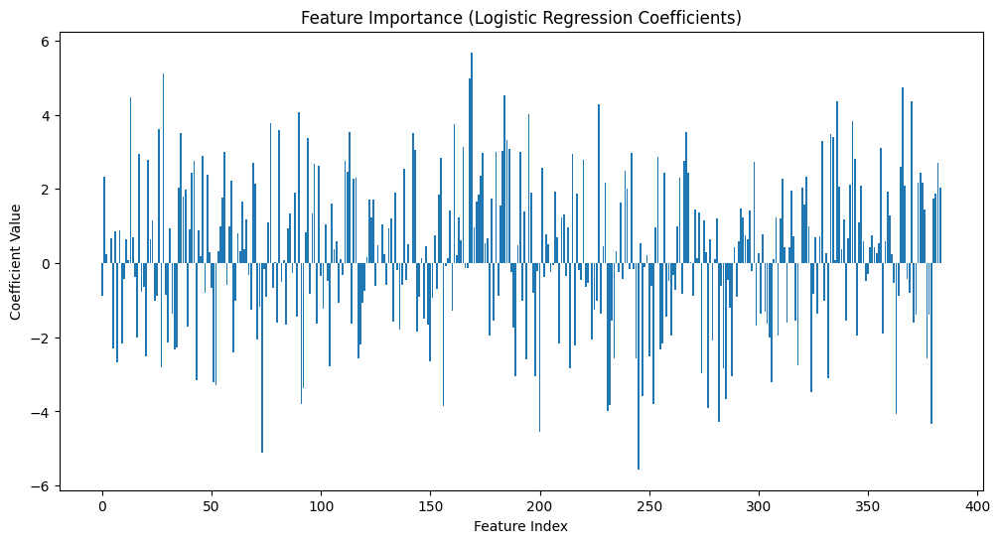

In [ ]:
import matplotlib.pyplot as plt

# Retrieve and plot coefficients without refitting
coefficients = clf_lr.best_estimator_.coef_[0]  # Accessing the best model from GridSearchCV

plt.figure(figsize=(12, 6))
plt.bar(range(len(coefficients)), coefficients)
plt.title('Feature Importance (Logistic Regression Coefficients)')
plt.xlabel('Feature Index')
plt.ylabel('Coefficient Value')
plt.show()


In [ ]:
import numpy as np
import plotly.graph_objects as go
from sklearn.decomposition import PCA

# Use the existing trained model (clf_lr from GridSearchCV)
trained_model = clf_lr.best_estimator_  # This fetches the best model from GridSearchCV

# Reduce BERT embeddings to 3D using PCA for visualization
pca = PCA(n_components=3)
X_train_3D = pca.fit_transform(X_train_bert)

# Create a mesh grid in the reduced 3D space for decision boundary
x_min, x_max = X_train_3D[:, 0].min() - 1, X_train_3D[:, 0].max() + 1
y_min, y_max = X_train_3D[:, 1].min() - 1, X_train_3D[:, 1].max() + 1
z_min, z_max = X_train_3D[:, 2].min() - 1, X_train_3D[:, 2].max() + 1
xx, yy, zz = np.meshgrid(
    np.linspace(x_min, x_max, 30),
    np.linspace(y_min, y_max, 30),
    np.linspace(z_min, z_max, 30)
)

# Predict using the existing model on the mesh grid
mesh_points = pca.inverse_transform(np.c_[xx.ravel(), yy.ravel(), zz.ravel()])
predictions = trained_model.predict(mesh_points).reshape(xx.shape)

# Create the 3D plot
fig = go.Figure()

# Plot the decision boundary as a 3D surface
fig.add_trace(go.Surface(
    x=xx[:, :, 0], y=yy[:, :, 0], z=zz[:, :, 0], surfacecolor=predictions[:, :, 0],
    colorscale='Viridis', opacity=0.5, showscale=False
))

# Plot training data points
fig.add_trace(go.Scatter3d(
    x=X_train_3D[:, 0], y=X_train_3D[:, 1], z=X_train_3D[:, 2],
    mode='markers', marker=dict(size=5, color=y_train, colorscale='Viridis', opacity=0.8),
    name='Training Points'
))

# Customize plot layout
fig.update_layout(
    title='3D Decision Boundary of Logistic Regression (PCA-reduced Data)',
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    )
)

fig.show()


### 03. SVC

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for SVC
tuned_parameters_svc = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

# Create the SVC model
svc_model = SVC()

# Perform grid search with cross-validation
clf_svc = GridSearchCV(estimator=svc_model,
                        param_grid=tuned_parameters_svc,
                        scoring='accuracy',
                        cv=5,
                        return_train_score=True,
                        verbose=1)

# Fit the model on training data
clf_svc.fit(X_train_bert, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'rbf']},
             return_train_score=True, scoring='accuracy', verbose=1)

In [ ]:
print("Best parameters set found on train set:")
print(clf_svc.best_params_)
print()
print('Best estimator:')
print(clf_svc.best_estimator_)
print()

# Score on Test Data
print('Score on Test Data: ', clf_svc.score(X_test_bert, y_test))


Best parameters set found on train set:
{'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}

Best estimator:
SVC(C=10)

Score on Test Data:  0.9874213836477987


In [ ]:
# Make predictions on test data
y_pred_svc = clf_svc.predict(X_test_bert)

In [ ]:
# Evaluate the SVC model on train and test sets
train_score_svc = clf_svc.score(X_train_bert, y_train)
test_score_svc = clf_svc.score(X_test_bert, y_test)

In [ ]:
from sklearn.metrics import confusion_matrix

# Generate confusion matrix
confusion_svc = confusion_matrix(y_test, y_pred_svc)

# Display confusion matrix
print("Confusion Matrix:")
print(confusion_svc)

Confusion Matrix:
[[151  11]
 [  3 948]]


In [ ]:
import plotly.express as px
import plotly.graph_objects as go

# Create a confusion matrix heatmap
fig = px.imshow(confusion_svc,
                 color_continuous_scale='Blues')

# Update layout
fig.update_layout(title='Confusion Matrix - SVC',
                  xaxis_title='Predicted Labels',
                  yaxis_title='Actual Labels',
                  xaxis=dict(tickvals=[0, 1], ticktext=["Spam (0)", "Ham (1)"]),
                  yaxis=dict(tickvals=[0, 1], ticktext=["Spam (0)", "Ham (1)"]))

# Show the plot
fig.show()

# Line plot for train and test scores
train_scores = clf_svc.cv_results_['mean_train_score']
test_scores = clf_svc.cv_results_['mean_test_score']
C_values = tuned_parameters_svc['C']

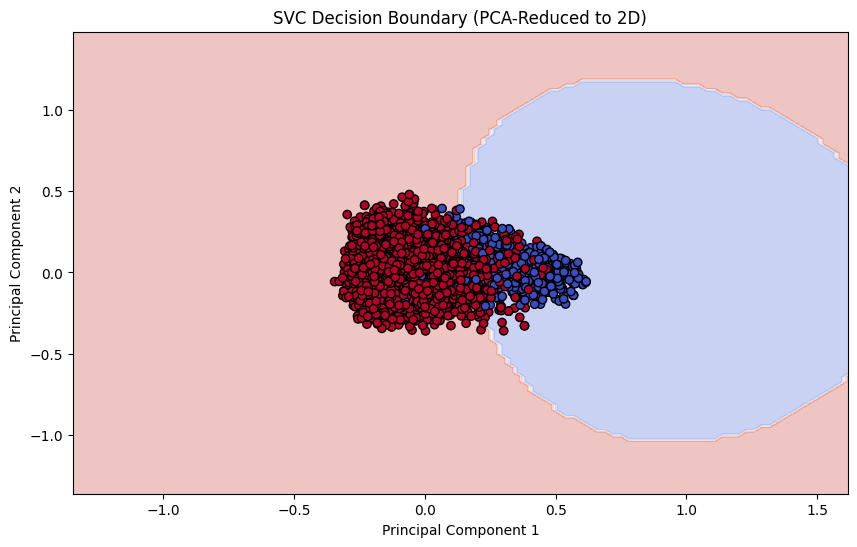

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.svm import SVC

# Assume svc_model is your trained SVC model
svc_model = clf_svc.best_estimator_  # Best estimator if using GridSearchCV

# Reduce BERT embeddings to 2D using PCA
pca = PCA(n_components=2)
X_train_2D = pca.fit_transform(X_train_bert)

# Create a mesh grid for decision boundary
x_min, x_max = X_train_2D[:, 0].min() - 1, X_train_2D[:, 0].max() + 1
y_min, y_max = X_train_2D[:, 1].min() - 1, X_train_2D[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# Predict on the mesh grid
Z = svc_model.predict(pca.inverse_transform(np.c_[xx.ravel(), yy.ravel()]))
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.figure(figsize=(10, 6))
plt.contourf(xx, yy, Z, alpha=0.3, cmap='coolwarm')
plt.scatter(X_train_2D[:, 0], X_train_2D[:, 1], c=y_train, edgecolor='k', cmap='coolwarm', marker='o')
plt.title('SVC Decision Boundary (PCA-Reduced to 2D)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


In [ ]:
import plotly.graph_objects as go
import numpy as np
from sklearn.decomposition import PCA

# Reduce data to 3D using PCA
pca_3d = PCA(n_components=3)
X_train_3D = pca_3d.fit_transform(X_train_bert)

# Create a 3D grid of points within the range of X_train_3D for prediction
x_min, x_max = X_train_3D[:, 0].min() - 1, X_train_3D[:, 0].max() + 1
y_min, y_max = X_train_3D[:, 1].min() - 1, X_train_3D[:, 1].max() + 1
z_min, z_max = X_train_3D[:, 2].min() - 1, X_train_3D[:, 2].max() + 1

xx, yy, zz = np.meshgrid(
    np.linspace(x_min, x_max, 20),
    np.linspace(y_min, y_max, 20),
    np.linspace(z_min, z_max, 20)
)

# Predict on the grid using the trained SVC model
grid_points = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]
grid_points_original = pca_3d.inverse_transform(grid_points)
predictions = svc_model.predict(grid_points_original).reshape(xx.shape)

# Create the 3D plot with isosurface and training points
fig = go.Figure()

# Add isosurface for the decision boundary
fig.add_trace(go.Isosurface(
    x=xx.flatten(), y=yy.flatten(), z=zz.flatten(), value=predictions.flatten(),
    opacity=0.2, colorscale='Viridis', isomin=0.5, isomax=0.5, surface_count=1
))

# Add training points in the 3D PCA-reduced space
fig.add_trace(go.Scatter3d(
    x=X_train_3D[:, 0], y=X_train_3D[:, 1], z=X_train_3D[:, 2],
    mode='markers', marker=dict(size=5, color=y_train, colorscale='Viridis', opacity=0.8),
    name='Training Points'
))

# Set plot layout
fig.update_layout(
    title='3D Decision Boundary of SVC (PCA-reduced Data)',
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    )
)

fig.show()

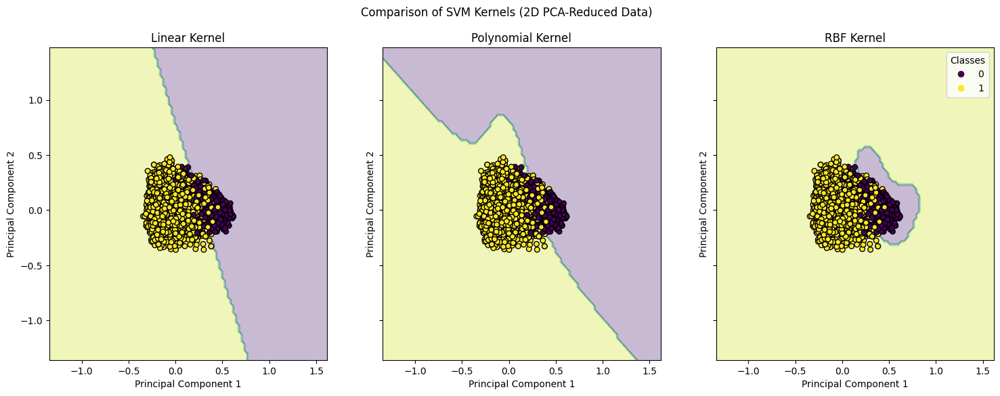

In [ ]:
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.datasets import make_classification
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# Reduce data to 2D using PCA
pca = PCA(n_components=2)
X_train_2D = pca.fit_transform(X_train_bert)

# Define a 2D grid for plotting decision boundaries
x_min, x_max = X_train_2D[:, 0].min() - 1, X_train_2D[:, 0].max() + 1
y_min, y_max = X_train_2D[:, 1].min() - 1, X_train_2D[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# Define SVM models with different kernels
kernels = ['linear', 'poly', 'rbf']
titles = ['Linear Kernel', 'Polynomial Kernel', 'RBF Kernel']
models = [SVC(kernel=kernel, C=1, gamma='scale') for kernel in kernels]

# Fit models and create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for model, title, ax in zip(models, titles, axes):
    # Train the model on 2D PCA-transformed data
    model.fit(X_train_2D, y_train)

    # Predict on the grid to get decision boundary
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot decision boundary and data points
    ax.contourf(xx, yy, Z, alpha=0.3, cmap='viridis')
    scatter = ax.scatter(X_train_2D[:, 0], X_train_2D[:, 1], c=y_train, cmap='viridis', edgecolor='k', s=30)
    ax.set_title(title)
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')

# Add a legend
plt.legend(*scatter.legend_elements(), title="Classes")
plt.suptitle('Comparison of SVM Kernels (2D PCA-Reduced Data)')
plt.show()

In [ ]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.decomposition import PCA
from sklearn.svm import SVC

# Reduce data to 3D using PCA
pca_3d = PCA(n_components=3)
X_train_3D = pca_3d.fit_transform(X_train_bert)

# Define a 3D grid for decision boundary visualization
x_min, x_max = X_train_3D[:, 0].min() - 1, X_train_3D[:, 0].max() + 1
y_min, y_max = X_train_3D[:, 1].min() - 1, X_train_3D[:, 1].max() + 1
z_min, z_max = X_train_3D[:, 2].min() - 1, X_train_3D[:, 2].max() + 1
xx, yy, zz = np.meshgrid(
    np.linspace(x_min, x_max, 20),
    np.linspace(y_min, y_max, 20),
    np.linspace(z_min, z_max, 20)
)

# Define SVM models with different kernels
kernels = ['linear', 'poly', 'rbf']
titles = ['Linear Kernel', 'Polynomial Kernel', 'RBF Kernel']
models = [SVC(kernel=kernel, C=1, gamma='scale') for kernel in kernels]

# Initialize figure for 3D subplots
fig = make_subplots(
    rows=1, cols=3,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}, {'type': 'scatter3d'}]],
    subplot_titles=titles
)

# Fit each SVM model and plot in 3D
for i, (model, title) in enumerate(zip(models, titles), 1):
    # Train the model on 3D PCA-reduced data
    model.fit(X_train_3D, y_train)

    # Predict on the 3D grid directly in PCA space
    grid_points = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]
    predictions = model.predict(grid_points).reshape(xx.shape)

    # Plot the decision boundary as an isosurface
    fig.add_trace(go.Isosurface(
        x=xx.flatten(), y=yy.flatten(), z=zz.flatten(),
        value=predictions.flatten(),
        opacity=0.3, colorscale='Viridis', isomin=0.5, isomax=0.5, surface_count=1
    ), row=1, col=i)

    # Add the training points in 3D
    fig.add_trace(go.Scatter3d(
        x=X_train_3D[:, 0], y=X_train_3D[:, 1], z=X_train_3D[:, 2],
        mode='markers', marker=dict(size=5, color=y_train, colorscale='Viridis', opacity=0.8),
        name='Training Points'
    ), row=1, col=i)

# Update layout for 3D plot
fig.update_layout(
    title='Comparison of SVM Kernels in 3D (PCA-reduced Data)',
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    )
)

fig.show()

### 04. Naive bayes

In [ ]:
# Step 1: Define Gaussian Naive Bayes model and hyperparameters
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV

# Define parameter grid
tuned_parameters_gnb = {'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]}

# Initialize GaussianNB and GridSearchCV
gnb_model = GaussianNB()
gnb_clf = GridSearchCV(
    estimator=gnb_model,
    param_grid=tuned_parameters_gnb,
    scoring='f1',
    cv=5,
    return_train_score=True,
    verbose=1
)

# Fit model on training data
gnb_clf.fit(X_train_bert, y_train)


Fitting 5 folds for each of 5 candidates, totalling 25 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': [1e-09, 1e-08, 1e-07, 1e-06, 1e-05]},
             return_train_score=True, scoring='f1', verbose=1)

In [ ]:
# Step 2: Display best parameters and estimator
print("Best parameters set found on train set:")
print(gnb_clf.best_params_)
print("\nBest estimator found:")
print(gnb_clf.best_estimator_)
print("\nScore on Test Data:", gnb_clf.score(X_test_bert, y_test))


Best parameters set found on train set:
{'var_smoothing': 1e-09}

Best estimator found:
GaussianNB()

Score on Test Data: 0.970276008492569


In [ ]:
# Step 3: Prediction
y_pred_gnb = gnb_clf.predict(X_test_bert)

In [ ]:
# Step 4: Evaluate model
from sklearn.metrics import confusion_matrix, classification_report

# Confusion Matrix and Classification Report
confusion_gnb = confusion_matrix(y_test, y_pred_gnb)
print("Confusion Matrix:")
print(confusion_gnb)

print("\nClassification Report:")
print(classification_report(y_test, y_pred_gnb, target_names=["Spam (0)", "Ham (1)"]))


Confusion Matrix:
[[143  19]
 [ 37 914]]

Classification Report:
              precision    recall  f1-score   support

    Spam (0)       0.79      0.88      0.84       162
     Ham (1)       0.98      0.96      0.97       951

    accuracy                           0.95      1113
   macro avg       0.89      0.92      0.90      1113
weighted avg       0.95      0.95      0.95      1113



In [ ]:
# Step 5: Print Train and Test Scores for Clarity
train_scores = gnb_clf.cv_results_['mean_train_score']
test_scores = gnb_clf.cv_results_['mean_test_score']
var_smoothing_values = gnb_clf.cv_results_['param_var_smoothing'].data

print("Train Scores:", train_scores)
print("Test Scores:", test_scores)
print("Variance Smoothing Values:", var_smoothing_values)


Train Scores: [0.97365137 0.97365137 0.97365137 0.97365137 0.97365137]
Test Scores: [0.97279462 0.97279462 0.97279462 0.97279462 0.97279462]
Variance Smoothing Values: [1.e-09 1.e-08 1.e-07 1.e-06 1.e-05]


In [ ]:
# Updated Line Plot with Scientific Notation for x-axis
import plotly.graph_objects as go

# Create line plot
fig_line = go.Figure()

# Plot train scores
fig_line.add_trace(go.Scatter(
    x=[f"{v:.0e}" for v in var_smoothing_values],
    y=train_scores,
    mode='lines+markers',
    name='Train Score',
    line=dict(color='blue'),
    marker=dict(size=8)
))

# Plot test scores
fig_line.add_trace(go.Scatter(
    x=[f"{v:.0e}" for v in var_smoothing_values],
    y=test_scores,
    mode='lines+markers',
    name='Test Score',
    line=dict(color='orange'),
    marker=dict(size=8)
))

# Update layout for better clarity
fig_line.update_layout(
    title='Train and Test Scores for Gaussian Naive Bayes (Variance Smoothing)',
    xaxis_title='Variance Smoothing (Scientific Notation)',
    yaxis_title='Score',
    yaxis=dict(range=[0.97, 0.98]),
    width=700,
    height=400
)

fig_line.show()


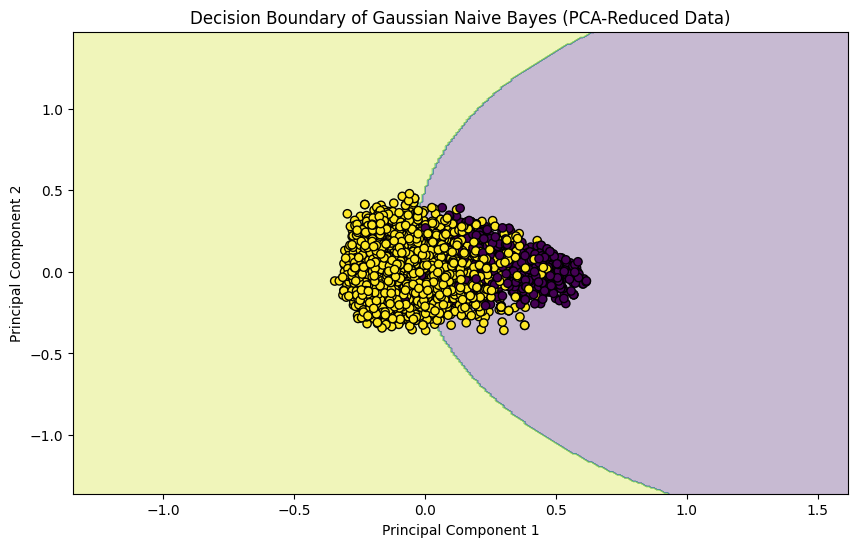

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reduce to 2D using PCA
pca = PCA(n_components=2)
X_train_2D = pca.fit_transform(X_train_bert)

# Create a mesh grid for decision boundary visualization
x_min, x_max = X_train_2D[:, 0].min() - 1, X_train_2D[:, 0].max() + 1
y_min, y_max = X_train_2D[:, 1].min() - 1, X_train_2D[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                     np.arange(y_min, y_max, 0.01))

# Predict on the mesh grid
Z = gnb_clf.predict(pca.inverse_transform(np.c_[xx.ravel(), yy.ravel()]))
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.figure(figsize=(10, 6))
plt.contourf(xx, yy, Z, alpha=0.3, cmap='viridis')
plt.scatter(X_train_2D[:, 0], X_train_2D[:, 1], c=y_train, edgecolors='k', cmap='viridis', marker='o')
plt.title('Decision Boundary of Gaussian Naive Bayes (PCA-Reduced Data)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


In [ ]:
import numpy as np
import plotly.graph_objects as go
from sklearn.decomposition import PCA

# Reduce data to 3D using PCA
pca = PCA(n_components=3)
X_train_3D = pca.fit_transform(X_train_bert)

# Create a mesh grid for decision boundary visualization
x_min, x_max = X_train_3D[:, 0].min() - 1, X_train_3D[:, 0].max() + 1
y_min, y_max = X_train_3D[:, 1].min() - 1, X_train_3D[:, 1].max() + 1
z_min, z_max = X_train_3D[:, 2].min() - 1, X_train_3D[:, 2].max() + 1
xx, yy, zz = np.meshgrid(
    np.linspace(x_min, x_max, 20),
    np.linspace(y_min, y_max, 20),
    np.linspace(z_min, z_max, 20)
)

# Predict on the mesh grid
mesh_points = pca.inverse_transform(np.c_[xx.ravel(), yy.ravel(), zz.ravel()])
predictions = gnb_clf.predict(mesh_points).reshape(xx.shape)

# Create 3D plot with Plotly
fig = go.Figure()

# Plot decision boundary surface
fig.add_trace(go.Volume(
    x=xx.ravel(), y=yy.ravel(), z=zz.ravel(),
    value=predictions.ravel(),
    isomin=0.5, isomax=1.5, opacity=0.1, surface_count=1,
    colorscale='Viridis', showscale=False
))

# Plot training points
fig.add_trace(go.Scatter3d(
    x=X_train_3D[:, 0], y=X_train_3D[:, 1], z=X_train_3D[:, 2],
    mode='markers', marker=dict(size=5, color=y_train, colorscale='Viridis', opacity=0.8),
    name='Training Points'
))

# Set plot layout
fig.update_layout(
    title='3D Decision Boundary of Gaussian Naive Bayes (PCA-Reduced Data)',
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    )
)

fig.show()


### 05. Decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

# Define hyperparameters and set up grid search
tuned_parameters_dt = {
    'max_depth': [None, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5, 10],
    'criterion': ["gini", "entropy"]
}

dt_clf = GridSearchCV(
    estimator=DecisionTreeClassifier(random_state=42),
    param_grid=tuned_parameters_dt,
    scoring='f1',
    cv=5,
    return_train_score=True,
    verbose=1
)

# Fit the model
dt_clf.fit(X_train_bert, y_train)

Fitting 5 folds for each of 120 candidates, totalling 600 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 5, 10, 15, 20],
                         'min_samples_leaf': [1, 2, 5, 10],
                         'min_samples_split': [2, 5, 10]},
             return_train_score=True, scoring='f1', verbose=1)

In [ ]:
# Display best parameters and estimator
print("Best parameters set found on training set:")
print(dt_clf.best_params_)
print("\nBest estimator found:")
print(dt_clf.best_estimator_)
print("\nScore on test data: ", dt_clf.score(X_test_bert, y_test))


Best parameters set found on training set:
{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5}

Best estimator found:
DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_split=5,
                       random_state=42)

Score on test data:  0.9581589958158996


In [ ]:
# Predict on test data
y_pred_dt = dt_clf.predict(X_test_bert)

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

# Generate and display the confusion matrix and classification report
confusion_dt = confusion_matrix(y_test, y_pred_dt)
print("Confusion Matrix:")
print(confusion_dt)

print("\nClassification Report:")
print(classification_report(y_test, y_pred_dt))


Confusion Matrix:
[[117  45]
 [ 35 916]]

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.72      0.75       162
           1       0.95      0.96      0.96       951

    accuracy                           0.93      1113
   macro avg       0.86      0.84      0.85      1113
weighted avg       0.93      0.93      0.93      1113



In [ ]:
import plotly.express as px
import plotly.graph_objects as go

# Confusion Matrix Heatmap
fig_cm = px.imshow(confusion_dt, text_auto=True, color_continuous_scale="Blues",
                   labels=dict(x="Predicted", y="Actual", color="Count"),
                   x=["Spam (0)", "Ham (1)"], y=["Spam (0)", "Ham (1)"])
fig_cm.update_layout(title="Decision Tree Confusion Matrix", width=400, height=400)
fig_cm.show()

In [ ]:

# Line Plot of Train/Test Scores
train_scores = dt_clf.cv_results_['mean_train_score']
test_scores = dt_clf.cv_results_['mean_test_score']
depth_values = [str(param['max_depth']) for param in dt_clf.cv_results_['params']]

fig_line = go.Figure()
fig_line.add_trace(go.Scatter(x=depth_values, y=train_scores, mode='lines+markers', name='Train Score'))
fig_line.add_trace(go.Scatter(x=depth_values, y=test_scores, mode='lines+markers', name='Test Score'))
fig_line.update_layout(title="Train and Test Scores for Decision Tree Hyperparameters",
                       xaxis_title="Max Depth",
                       yaxis_title="F1 Score",
                       width=600,
                       height=400)
fig_line.show()

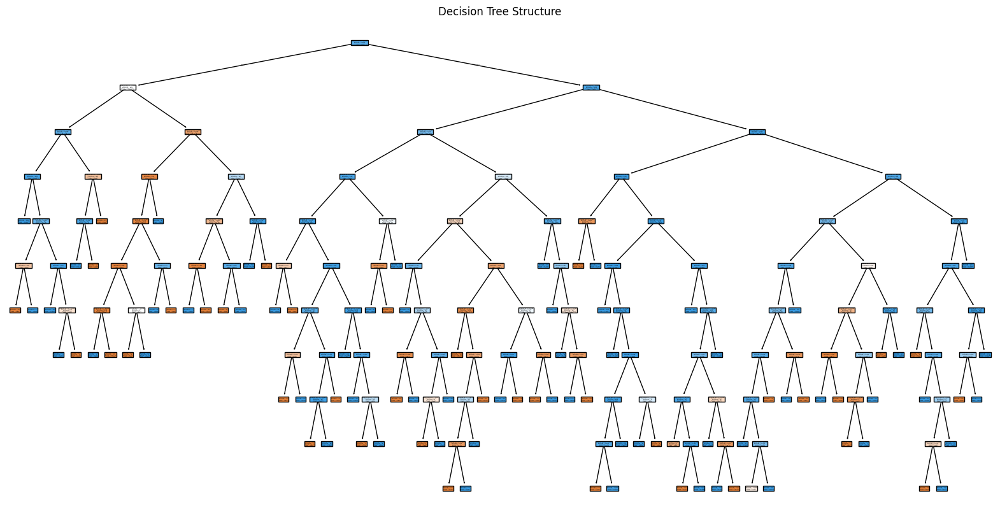

In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Generate feature names for each dimension in BERT embeddings
num_features = X_train_bert.shape[1]
feature_names = [f'Feature {i}' for i in range(num_features)]

# Extract the best estimator (the optimal tree from GridSearchCV)
best_dt_model = dt_clf.best_estimator_

# Plot the tree
plt.figure(figsize=(20, 10))
plot_tree(best_dt_model, filled=True, feature_names=feature_names, class_names=['Ham', 'Spam'])
plt.title("Decision Tree Structure")
plt.show()

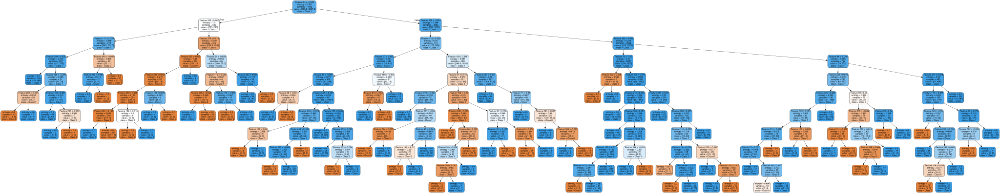

In [ ]:
from sklearn.tree import export_graphviz
import graphviz
from IPython.display import display

# Export the decision tree to a DOT file
dot_data = export_graphviz(
    best_dt_model,
    out_file=None,
    feature_names=[f'Feature {i}' for i in range(X_train_bert.shape[1])],
    class_names=['Class 0', 'Class 1'],
    filled=True,
    rounded=True,
    special_characters=True
)

# Render the DOT file using Graphviz
graph = graphviz.Source(dot_data)
display(graph)


In [ ]:
from sklearn.tree import export_graphviz
import graphviz

# Export the decision tree to a DOT file
dot_data = export_graphviz(
    best_dt_model,
    out_file=None,
    feature_names=[f'Feature {i}' for i in range(X_train_bert.shape[1])],
    class_names=['Class 0', 'Class 1'],
    filled=True,
    rounded=True,
    special_characters=True
)

# Render the DOT file using Graphviz
graph = graphviz.Source(dot_data)

# Save the image in PNG format
graph.render('decision_tree', format='png', cleanup=True)  # This will save the file as 'decision_tree.png'

# Optionally, display the graph
graph.view()  # This opens the saved file

'decision_tree.pdf'

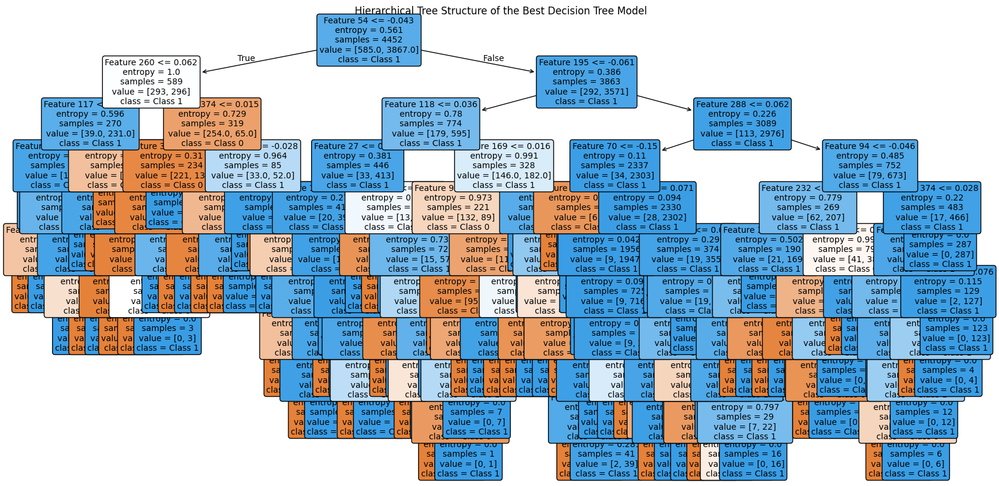

In [ ]:
from sklearn.tree import export_graphviz
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Retrieve the best model from GridSearchCV
best_dt_model = dt_clf.best_estimator_

# Plot the decision tree
plt.figure(figsize=(20, 10))
plot_tree(best_dt_model, filled=True, feature_names=[f'Feature {i}' for i in range(X_train_bert.shape[1])],
          class_names=['Class 0', 'Class 1'], rounded=True, fontsize=10)
plt.title("Hierarchical Tree Structure of the Best Decision Tree Model")
plt.show()


In [ ]:
X_train_bert.shape

(4452, 384)

### 06. Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Define the model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model to the training data
rf_model.fit(X_train_bert, y_train)

# Print scores
train_score_rf = rf_model.score(X_train_bert, y_train)
test_score_rf = rf_model.score(X_test_bert, y_test)

print(f'Train Score: {train_score_rf}')
print(f'Test Score: {test_score_rf}')

Train Score: 1.0
Test Score: 0.949685534591195


In [ ]:
# Make predictions
y_pred_rf = rf_model.predict(X_test_bert)

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

# Confusion Matrix
confusion_rf = confusion_matrix(y_test, y_pred_rf)

# Classification Report
class_report_rf = classification_report(y_test, y_pred_rf)

print("Confusion Matrix:")
print(confusion_rf)
print("\nClassification Report:")
print(class_report_rf)

Confusion Matrix:
[[106  56]
 [  0 951]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.65      0.79       162
           1       0.94      1.00      0.97       951

    accuracy                           0.95      1113
   macro avg       0.97      0.83      0.88      1113
weighted avg       0.95      0.95      0.95      1113



In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

# Create a confusion matrix heatmap
fig = px.imshow(confusion_rf,
                 labels=dict(x="Predicted", y="Actual"),
                 x=["Spam (0)", "Ham (1)"],
                 y=["Spam (0)", "Ham (1)"],
                 color_continuous_scale='Blues',
                 text_auto=True)  # Show the values in each box

# Update layout for the confusion matrix
fig.update_layout(title='Confusion Matrix - Random Forest',
                  xaxis_title='Predicted',
                  yaxis_title='Actual',
                  width=600,  # Set width for better visibility
                  height=500,  # Set height for better visibility
                  xaxis=dict(tickmode='array', tickvals=["Spam (0)", "Ham (1)"], ticktext=["Spam (0)", "Ham (1)"]),
                  yaxis=dict(tickmode='array', tickvals=["Spam (0)", "Ham (1)"], ticktext=["Spam (0)", "Ham (1)"]))

# Show the confusion matrix plot
fig.show()


In [ ]:

# Line plot for train and test scores
# Create line plot
fig_scores = go.Figure()

# Define the x values as labels for the scores
x_values = ['Train Score', 'Test Score']

# Add traces for train and test scores
fig_scores.add_trace(go.Scatter(x=x_values,
                                  y=[train_score_rf, test_score_rf],
                                  mode='lines+markers',
                                  name='Scores',
                                  line=dict(shape='linear', color='royalblue', width=4),
                                  marker=dict(size=10, color='red', symbol='circle')))  # Distinct markers

# Update layout for the line plot
fig_scores.update_layout(title='Random Forest Train and Test Scores',
                          xaxis_title='Model Scores',
                          yaxis_title='Scores',
                          yaxis=dict(range=[0.8, 1.0], tickmode='linear', tickvals=np.arange(0.8, 1.1, 0.05)),  # Zoomed in range
                          xaxis=dict(title='Hyperparameter: Model Scores', tickvals=x_values))  # Define the x-axis title properly

# Add a horizontal line at the test score for clarity
fig_scores.add_shape(type='line',
                      x0=-0.5, y0=test_score_rf, x1=1.5, y1=test_score_rf,
                      line=dict(color='orange', width=2, dash='dash'),  # Orange dashed line
                      name='Test Score Line')

# Show the line plot
fig_scores.show()

In [ ]:
from sklearn.decomposition import PCA
import numpy as np
import plotly.graph_objects as go

# Reduce BERT embeddings to 3D for visualization
pca_3d = PCA(n_components=3)
X_train_3D = pca_3d.fit_transform(X_train_bert)
X_test_3D = pca_3d.transform(X_test_bert)

# Create a 3D mesh grid for the decision boundary
x_min, x_max = X_train_3D[:, 0].min() - 1, X_train_3D[:, 0].max() + 1
y_min, y_max = X_train_3D[:, 1].min() - 1, X_train_3D[:, 1].max() + 1
z_min, z_max = X_train_3D[:, 2].min() - 1, X_train_3D[:, 2].max() + 1

xx, yy, zz = np.meshgrid(
    np.linspace(x_min, x_max, 20),
    np.linspace(y_min, y_max, 20),
    np.linspace(z_min, z_max, 20)
)

# Flatten and inverse-transform the grid points to original space for prediction
grid_points = pca_3d.inverse_transform(np.c_[xx.ravel(), yy.ravel(), zz.ravel()])
Z = rf_model.predict(grid_points).reshape(xx.shape)

# Create the Plotly 3D plot
fig = go.Figure()

# Plot the decision boundary surface
fig.add_trace(go.Volume(
    x=xx.ravel(), y=yy.ravel(), z=zz.ravel(), value=Z.ravel(),
    opacity=0.2,  # Adjust transparency
    surface_count=2,  # Shows decision boundary surfaces
    colorscale='Viridis'
))

# Plot training points
fig.add_trace(go.Scatter3d(
    x=X_train_3D[:, 0], y=X_train_3D[:, 1], z=X_train_3D[:, 2],
    mode='markers',
    marker=dict(size=5, color=y_train, colorscale='Viridis', opacity=0.8),
    name='Training Points'
))

# Plot test points
fig.add_trace(go.Scatter3d(
    x=X_test_3D[:, 0], y=X_test_3D[:, 1], z=X_test_3D[:, 2],
    mode='markers',
    marker=dict(size=5, color=y_test, colorscale='Inferno', opacity=0.6, symbol='x'),
    name='Test Points'
))

# Set plot layout
fig.update_layout(
    title='3D Decision Boundary of Random Forest (PCA-Reduced Data)',
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    )
)

fig.show()

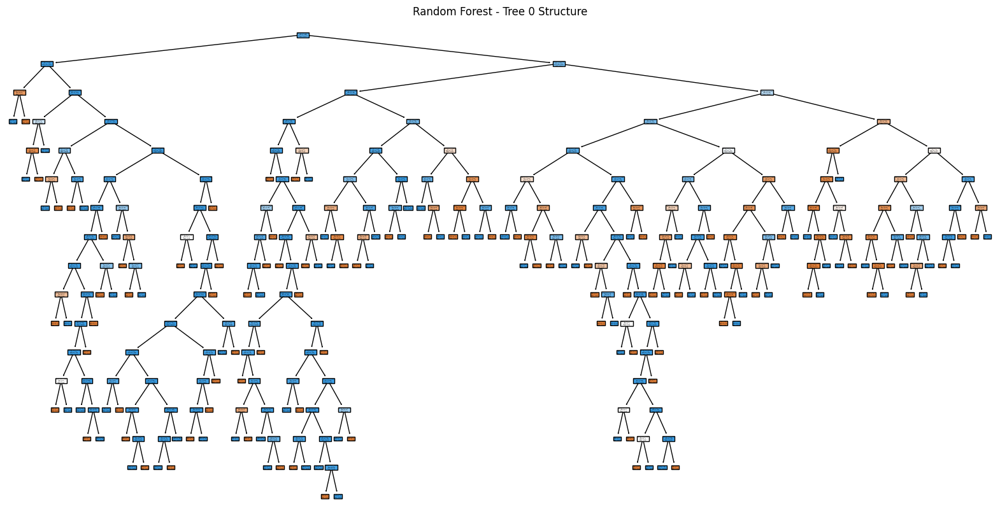

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Define the RandomForest model and fit it to the training data
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train_bert, y_train)

# Generate feature names for each dimension in BERT embeddings
num_features = X_train_bert.shape[1]
feature_names = [f'Feature {i}' for i in range(num_features)]

estimator = rf_model.estimators_[0]

# Plot the chosen tree
plt.figure(figsize=(20, 10))
plot_tree(estimator, filled=True, feature_names=feature_names, class_names=['Ham', 'Spam'])
plt.title("Random Forest - Tree 0 Structure")
plt.show()

### 07. ANN

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

# Define the ANN model
ann_model = Sequential()
ann_model.add(Dense(128, activation='relu', input_shape=(X_train_bert.shape[1],)))
ann_model.add(Dropout(0.5))
ann_model.add(Dense(64, activation='relu'))
ann_model.add(Dropout(0.5))
ann_model.add(Dense(32, activation='relu'))
ann_model.add(Dropout(0.5))
ann_model.add(Dense(1, activation='sigmoid'))  # Use sigmoid for binary classification

# Compile the model
ann_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Fit the model to the training data
ann_model.fit(X_train_bert, y_train, epochs=10, batch_size=32, validation_split=0.2)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7237 - loss: 0.5312 - val_accuracy: 0.9428 - val_loss: 0.1505
Epoch 2/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9380 - loss: 0.1670 - val_accuracy: 0.9798 - val_loss: 0.0675
Epoch 3/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9764 - loss: 0.0741 - val_accuracy: 0.9877 - val_loss: 0.0524
Epoch 4/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9843 - loss: 0.0637 - val_accuracy: 0.9899 - val_loss: 0.0532
Epoch 5/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9882 - loss: 0.0408 - val_accuracy: 0.9888 - val_loss: 0.0449
Epoch 6/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9883 - loss: 0.0355 - val_accuracy: 0.9865 - val_loss: 0.0559
Epoch 7/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9946 - loss: 0.0276 - val_accuracy: 0.9877 - val_loss: 0.0578
Epoch 8/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9952 - loss: 0.0195 - val_accuracy: 0.

In [ ]:
# Make predictions
y_pred_ann_probs = ann_model.predict(X_test_bert)  # Get probabilities
y_pred_ann = (y_pred_ann_probs > 0.5).astype(int)  # Convert probabilities to binary output

35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


In [ ]:
# Evaluate the model on the training data
train_loss, train_accuracy = ann_model.evaluate(X_train_bert, y_train, verbose=0)

# Evaluate the model on the test data
test_loss, test_accuracy = ann_model.evaluate(X_test_bert, y_test, verbose=0)

# Store the scores for comparison
train_score_ann = train_accuracy
test_score_ann = test_accuracy

# Print the scores
print(f"Train Accuracy: {train_score_ann:.4f}, Test Accuracy: {test_score_ann:.4f}")


Train Accuracy: 0.9971, Test Accuracy: 0.9820


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

# Confusion Matrix
confusion_ann = confusion_matrix(y_test, y_pred_ann)

# Classification Report
class_report_ann = classification_report(y_test, y_pred_ann)

print("Confusion Matrix:")
print(confusion_ann)
print("\nClassification Report:")
print(class_report_ann)

Confusion Matrix:
[[153   9]
 [ 11 940]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.94      0.94       162
           1       0.99      0.99      0.99       951

    accuracy                           0.98      1113
   macro avg       0.96      0.97      0.96      1113
weighted avg       0.98      0.98      0.98      1113



In [ ]:
import plotly.express as px
import plotly.graph_objects as go

# Create a confusion matrix heatmap
fig = px.imshow(confusion_ann,
                 labels=dict(x="Predicted", y="Actual"),
                 x=["Spam (0)", "Ham (1)"],
                 y=["Spam (0)", "Ham (1)"],
                 color_continuous_scale='Blues',
                 text_auto=True)  # Show the values in each box

# Update layout for the confusion matrix
fig.update_layout(title='Confusion Matrix - ANN',
                  xaxis_title='Predicted',
                  yaxis_title='Actual',
                  width=600,  # Set width for better visibility
                  height=500)  # Set height for better visibility

# Show the confusion matrix plot
fig.show()


In [ ]:
import numpy as np
import plotly.graph_objects as go
from sklearn.decomposition import PCA

# Reduce BERT embeddings to 3D for visualization
pca_3d = PCA(n_components=3)
X_train_3D = pca_3d.fit_transform(X_train_bert)
X_test_3D = pca_3d.transform(X_test_bert)

# Create a 3D mesh grid for the decision boundary
x_min, x_max = X_train_3D[:, 0].min() - 1, X_train_3D[:, 0].max() + 1
y_min, y_max = X_train_3D[:, 1].min() - 1, X_train_3D[:, 1].max() + 1
z_min, z_max = X_train_3D[:, 2].min() - 1, X_train_3D[:, 2].max() + 1
xx, yy, zz = np.meshgrid(
    np.linspace(x_min, x_max, 20),
    np.linspace(y_min, y_max, 20),
    np.linspace(z_min, z_max, 20)
)

# Flatten the grid and transform back to original space for prediction
grid_points = pca_3d.inverse_transform(np.c_[xx.ravel(), yy.ravel(), zz.ravel()])
grid_predictions = ann_model.predict(grid_points).reshape(xx.shape)

# Create the Plotly 3D plot
fig = go.Figure()

# Plot the decision boundary volume
fig.add_trace(go.Volume(
    x=xx.ravel(), y=yy.ravel(), z=zz.ravel(), value=grid_predictions.ravel(),
    opacity=0.1,  # Adjust opacity for better visualization
    surface_count=2,  # Shows decision boundary surfaces
    colorscale='Viridis'
))

# Plot training points
fig.add_trace(go.Scatter3d(
    x=X_train_3D[:, 0], y=X_train_3D[:, 1], z=X_train_3D[:, 2],
    mode='markers',
    marker=dict(size=5, color=y_train, colorscale='Viridis', opacity=0.8),
    name='Training Points'
))

# Plot test points
fig.add_trace(go.Scatter3d(
    x=X_test_3D[:, 0], y=X_test_3D[:, 1], z=X_test_3D[:, 2],
    mode='markers',
    marker=dict(size=5, color=y_test, colorscale='Inferno', opacity=0.6, symbol='x'),
    name='Test Points'
))

# Set plot layout
fig.update_layout(
    title='3D Decision Boundary of ANN Model (PCA-Reduced Data)',
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    )
)

fig.show()


250/250 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


## **Step 6 - Comparing Scores of Models**

In [ ]:
import plotly.graph_objects as go

# Model names and their respective scores
model_names = ['KNN', 'Logistic Regression', 'Gaussian NB', 'Decision Tree', 'Random Forest', 'ANN', 'SVC']
train_scores = [train_score_knn, train_score_lr, train_score_nb, train_score_dt, train_score_rf, train_score_ann, train_score_svc]
test_scores = [test_score_knn, test_score_lr, test_score_nb, test_score_dt, test_score_rf, test_score_ann, test_score_svc]

# Create a comparison plot
fig_bar = go.Figure()

# Add traces for Train and Test scores
fig_bar.add_trace(go.Bar(name='Train Score', x=model_names, y=train_scores, marker_color='royalblue'))
fig_bar.add_trace(go.Bar(name='Test Score', x=model_names, y=test_scores, marker_color='lightblue'))

# Update layout
fig_bar.update_layout(title='Train and Test Score Comparison',
                      xaxis_title='Models',
                      yaxis_title='Scores',
                      barmode='group',
                      yaxis=dict(range=[0, 1]))  # Set y-axis range

# Show the plot
fig_bar.show()


In [ ]:
import plotly.express as px
import pandas as pd

# Create a DataFrame for box plot
scores_data = {
    'Model': ['KNN'] * 10 + ['Logistic Regression'] * 10 + ['Gaussian NB'] * 10 +
              ['Decision Tree'] * 10 + ['Random Forest'] * 10 + ['ANN'] * 10 + ['SVC'] * 10,
    'Score': [
        # KNN scores
        train_score_knn, train_score_knn, train_score_knn, train_score_knn, train_score_knn,
        test_score_knn, test_score_knn, test_score_knn, test_score_knn, test_score_knn,
        # Logistic Regression scores
        train_score_lr, train_score_lr, train_score_lr, train_score_lr, train_score_lr,
        test_score_lr, test_score_lr, test_score_lr, test_score_lr, test_score_lr,
        # Gaussian NB scores
        train_score_nb, train_score_nb, train_score_nb, train_score_nb, train_score_nb,
        test_score_nb, test_score_nb, test_score_nb, test_score_nb, test_score_nb,
        # Decision Tree scores
        train_score_dt, train_score_dt, train_score_dt, train_score_dt, train_score_dt,
        test_score_dt, test_score_dt, test_score_dt, test_score_dt, test_score_dt,
        # Random Forest scores
        train_score_rf, train_score_rf, train_score_rf, train_score_rf, train_score_rf,
        test_score_rf, test_score_rf, test_score_rf, test_score_rf, test_score_rf,
        # ANN scores
        train_score_ann, train_score_ann, train_score_ann, train_score_ann, train_score_ann,
        test_score_ann, test_score_ann, test_score_ann, test_score_ann, test_score_ann,
        # SVC scores
        train_score_svc, train_score_svc, train_score_svc, train_score_svc, train_score_svc,
        test_score_svc, test_score_svc, test_score_svc, test_score_svc, test_score_svc
    ]
}
scores_df = pd.DataFrame(scores_data)

# Create box plot
fig_box = px.box(scores_df, x='Model', y='Score', color='Model',
                 title='Box Plot of Model Scores',
                 labels={'Score': 'Scores', 'Model': 'Models'})

# Customize outlier marker color
fig_box.update_traces(marker=dict(outliercolor='rgba(219, 64, 82, 0.6)'))

# Show the plot
fig_box.show()


35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


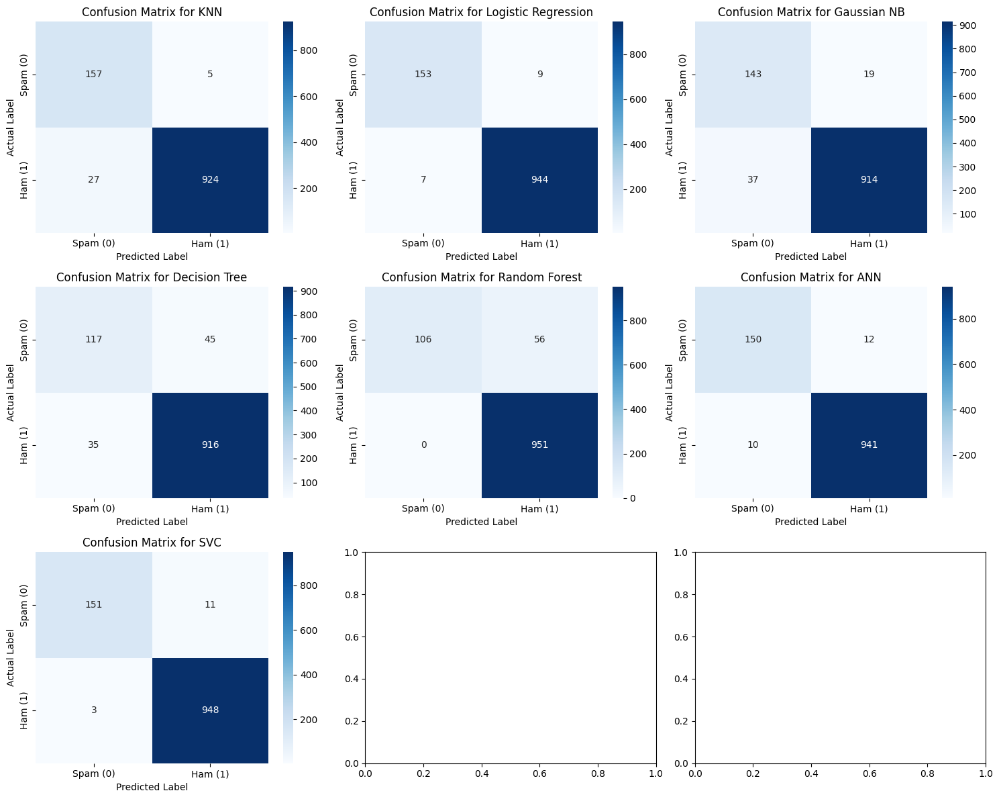

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calculate predictions for each model
y_pred_knn = clf_knn.predict(X_test_bert)
y_pred_lr = clf_lr.predict(X_test_bert)
y_pred_nb = gnb_clf.predict(X_test_bert)
y_pred_dt = dt_clf.predict(X_test_bert)
y_pred_rf = rf_model.predict(X_test_bert)
y_pred_ann = (ann_model.predict(X_test_bert) > 0.5).astype("int32")  # For ANN
y_pred_svc = clf_svc.predict(X_test_bert)  # Add SVC predictions

# Calculate confusion matrices for each model
confusion_matrices = {
    'KNN': confusion_matrix(y_test, y_pred_knn),
    'Logistic Regression': confusion_matrix(y_test, y_pred_lr),
    'Gaussian NB': confusion_matrix(y_test, y_pred_nb),
    'Decision Tree': confusion_matrix(y_test, y_pred_dt),
    'Random Forest': confusion_matrix(y_test, y_pred_rf),
    'ANN': confusion_matrix(y_test, y_pred_ann),
    'SVC': confusion_matrix(y_test, y_pred_svc),  # Add SVC confusion matrix
}

# Create a grid of heatmaps for each confusion matrix
fig, axes = plt.subplots(3, 3, figsize=(15, 12))  # Adjust grid size to 3x3 for 7 models
axes = axes.flatten()  # Flatten the 2D array to 1D for easy indexing

for ax, (model_name, cm) in zip(axes, confusion_matrices.items()):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=['Spam (0)', 'Ham (1)'],
                yticklabels=['Spam (0)', 'Ham (1)'])
    ax.set_title(f'Confusion Matrix for {model_name}')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('Actual Label')

plt.tight_layout()
plt.show()


In [ ]:
import plotly.graph_objects as go

# Model names and their respective scores including SVC
model_names = ['KNN', 'Logistic Regression', 'Gaussian NB', 'Decision Tree', 'Random Forest', 'ANN', 'SVC']
train_scores = [train_score_knn, train_score_lr, train_score_nb, train_score_dt, train_score_rf, train_score_ann, train_score_svc]
test_scores = [test_score_knn, test_score_lr, test_score_nb, test_score_dt, test_score_rf, test_score_ann, test_score_svc]

# Create a line plot for Train and Test scores
fig_line = go.Figure()

# Add traces for Train and Test scores
fig_line.add_trace(go.Scatter(x=model_names, y=train_scores, mode='lines+markers', name='Train Score'))
fig_line.add_trace(go.Scatter(x=model_names, y=test_scores, mode='lines+markers', name='Test Score'))

# Update layout with zoomed-in y-axis
fig_line.update_layout(title='Train and Test Score Comparison',
                       xaxis_title='Models',
                       yaxis_title='Scores',
                       yaxis=dict(range=[0.8, 1]),  # Set y-axis range to zoom in
                       template='plotly_white')  # Optional: Use a clean template

# Show the plot
fig_line.show()


In [ ]:
import joblib

# Save Scikit-learn models as .pkl files
joblib.dump(clf_knn, '/content/drive/MyDrive/Colab Notebooks/590/data/knn_model.pkl')
joblib.dump(clf_lr, '/content/drive/MyDrive/Colab Notebooks/590/data/logistic_regression_model.pkl')
joblib.dump(gnb_clf, '/content/drive/MyDrive/Colab Notebooks/590/data/gaussian_nb_model.pkl')
joblib.dump(dt_clf, '/content/drive/MyDrive/Colab Notebooks/590/data/decision_tree_model.pkl')
joblib.dump(rf_model, '/content/drive/MyDrive/Colab Notebooks/590/data/random_forest_model.pkl')
joblib.dump(clf_svc, '/content/drive/MyDrive/Colab Notebooks/590/data/svc_model.pkl')

# If you have an ANN model (using Keras), you can save it as a .pkl file as well (after converting to a format suitable for saving)
import pickle

# Save ANN model using pickle (if it’s a Keras model, you should save it as .h5)
with open('/content/drive/MyDrive/Colab Notebooks/590/data/ann_model.pkl', 'wb') as f:
    pickle.dump(ann_model, f)


## **Step 7 -  Prediction**

In [ ]:
spam_sms = """Dear John,

We are thrilled to inform you that you've been selected as a winner in our exclusive promotion! As a special prize, you’ve earned a free all-expenses-paid trip to the stunning beaches of Hawaii.

To claim your complimentary tickets, simply follow the link below to secure your spot. Don’t miss out—this offer is only available for a limited time!

[Claim My Free Tickets Now]
http://www.expediaa.com/__win-hawaii-now__/wbcubucybreucwe/iuwgqiuhwubhbviuqd/qfeoifnuo23n398j2323

Hurry, time is running out!

Warm regards,
The expedia Team"""

In [ ]:
from sentence_transformers import SentenceTransformer

# Load the MiniLM model for encoding
bert_model = SentenceTransformer('all-MiniLM-L6-v2')  # Use your specified model

# Encode the SMS using the MiniLM model
sms_embedding = bert_model.encode([spam_sms])


In [ ]:
import joblib

# Load the Logistic Regression model
clf_lr = joblib.load('/content/drive/MyDrive/Colab Notebooks/590 Project/data/logistic_regression_model.pkl')

# Make a prediction using the loaded Logistic Regression model
prediction = clf_lr.predict(sms_embedding)

# Interpret the result
sms_label = 'Ham' if prediction == 1 else 'Spam'
print(f"The SMS is predicted as: {sms_label}")

The SMS is predicted as: Spam
